# TFI 1: Mejora y restauracion de imagenes

**Modalidad:** trabajo en parejas con defensa oral breve e individual.

**Entrega:** notebook completo + carpeta de imagenes originales + carpeta de resultados procesados.

En este Trabajo Final Integrador vas a reunir tecnicas vistas en las unidades de bibliotecas basicas de PDI y vision por computadora para resolver tres casos obligatorios. La idea no es aplicar filtros de manera automatica, sino leer un problema visual, comparar estrategias y justificar una decision tecnica.

Los tres casos son:

1. imagen obtenida mediante camara oscura;
2. imagen de medio grafico color;
3. imagen de medio grafico blanco/negro.


## Objetivo

Construir tres pipelines acotados de mejora y restauracion, comparar alternativas por caso y sostener una eleccion final con evidencia visual y criterio tecnico.

## Resultados de aprendizaje esperados

Al finalizar este trabajo, vas a poder:

- diagnosticar problemas frecuentes de contraste, ruido, perspectiva e iluminacion;
- elegir operaciones pertinentes segun el tipo de imagen;
- justificar parametros y descartar estrategias poco adecuadas;
- comparar resultados sin reducir la decision a "queda mejor";
- explicar limites tecnicos de una restauracion digital.

## Relacion con la secuencia

Este TFI recupera y combina ideas trabajadas en `003 - librerias_fundamentos_pdi` y `004 - computer_vision_parte_1`: diagnostico inicial, ajuste de brillo y contraste, `CLAHE`, cambio de perspectiva, suavizado, umbralizacion, morfologia e `inpainting`.


## Trabajo con IA

Podes usar IA como apoyo para discutir alternativas, revisar errores de codigo o auditar una decision tecnica. Pero no vale usarla como reemplazo de tu criterio. Toda seleccion de parametros, toda justificacion y toda version entregada tienen que quedar bajo tu responsabilidad.

### Registro breve del uso de IA


| Caso | Objetivo de la consulta | Pedido a la IA | Que conservaste y por que | Que descartaste y por que | Que aprendiste |
|---|---|---|---|---|---|
| Camara oscura | No se utilizó | N/A | N/A | N/A | N/A |
| Medio grafico color | No se utilizó | N/A | N/A | N/A | N/A |
| Medio grafico blanco/negro | No se utilizó | N/A | N/A | N/A | N/A |
| Dashboard | Armado de dashboard informativo | Armar dashboard HTML que recapitule cada método aplicable en cada uno de los casos | Se conservó la página generada por completo| - | Se utilizó con el fin de organizar todos los métodos utilizados para que al momento de consultarlo no tuvieramos necesidad de realizar la búsqueda manual en todos los notebooks de las distintas clases |


## Restricciones del trabajo

- Tenes que resolver los **tres casos obligatorios**.
- En cada caso tenes que mostrar al menos **dos estrategias comparables**.
- Cada estrategia tiene que responder a un problema visual observado, no a una receta previa.
- No alcanza con decir que una imagen "queda mejor". Tenes que explicar **que problema resolvio**, **que cambio produjo** y **que limite mantiene**.
- Conviene que cada pipeline tenga entre **2 y 4 operaciones principales**. Si agregas mas pasos, tenes que justificar por que cada uno aporta algo distinto.
- Para el caso blanco/negro, si necesitas apoyo, revisa antes o durante este trabajo `004 - computer_vision_parte_1/006b2 - umbralizacion global, Otsu y adaptive threshold.ipynb`.


## Modulos que vamos a usar

- `pathlib.Path`: para trabajar con rutas de archivo.
- `cv2`: para leer imagenes y aplicar operaciones de procesamiento.
- `numpy`: para operar con arreglos y mascaras.
- `matplotlib.pyplot`: para comparar visualmente resultados.
- `pandas`: para construir la tabla final de comparacion.


In [ ]:
# Importación de librerías a utilizar
from pathlib import Path
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Definición de rutas de las carpetas de imagenes de entrada y salida
carpeta_imagenes_tfi = Path("imagenes_tfi1")
carpeta_salidas_tfi = Path("salidas_tfi1")

# Creación de la carpeta de salida si aún no existe
carpeta_salidas_tfi.mkdir(exist_ok=True)

print(f"Carpeta esperada para originales: {carpeta_imagenes_tfi.resolve()}")
print(f"Carpeta esperada para resultados: {carpeta_salidas_tfi.resolve()}")


Carpeta esperada para originales: C:\Users\Tamara\Desktop\PDI 2026\rodriguez-carmen-pdi-1c-2026\006 - TFI_1\imagenes_tfi1
Carpeta esperada para resultados: C:\Users\Tamara\Desktop\PDI 2026\rodriguez-carmen-pdi-1c-2026\006 - TFI_1\salidas_tfi1


## Funciones de apoyo



In [ ]:
def cargar_rgb(ruta):
    """Carga una imagen a color y la devuelve en RGB."""
    imagen_bgr = cv2.imread(str(ruta), cv2.IMREAD_COLOR)

    if imagen_bgr is None:
        raise FileNotFoundError(f"No se pudo leer la imagen: {ruta}")
    
    imagen_rgb = cv2.cvtColor(imagen_bgr, cv2.COLOR_BGR2RGB)

    return imagen_rgb

def cargar_gris(ruta):
    """Carga una imagen en escala de grises."""
    imagen_gris = cv2.imread(str(ruta), cv2.IMREAD_GRAYSCALE)

    if imagen_gris is None:
        raise FileNotFoundError(f"No se pudo leer la imagen: {ruta}")
    
    return imagen_gris

def mostrar_imagen(imagen, titulo="Imagen"):
    """Muestra una sola imagen con un titulo."""
    plt.figure(figsize=(7, 6), constrained_layout=True)

    mapa_de_color = None
    if imagen.ndim == 2:
        mapa_de_color = "gray"

    plt.imshow(imagen, cmap=mapa_de_color)
    plt.title(titulo, fontweight="bold", loc="left")
    plt.axis("off")
    plt.show()

def mostrar_comparacion(imagen_izquierda, imagen_derecha, titulo_izquierda, titulo_derecha):
    """Muestra una comparacion simple entre dos imagenes."""
    figura, ejes = plt.subplots(1, 2, figsize=(12, 5), constrained_layout=True)

    mapa_izquierda = None
    if imagen_izquierda.ndim == 2:
        mapa_izquierda = "gray"
    
    ejes[0].imshow(imagen_izquierda, cmap=mapa_izquierda)
    ejes[0].set_title(titulo_izquierda, fontweight="bold", loc="left")
    ejes[0].axis("off")

    mapa_derecha = None
    if imagen_derecha.ndim == 2:
        mapa_derecha = "gray"

    ejes[1].imshow(imagen_derecha, cmap=mapa_derecha)
    ejes[1].set_title(titulo_derecha, fontweight="bold", loc="left")
    ejes[1].axis("off")

    plt.show()

def mostrar_histograma_gris(imagen):
    """Muestra el histograma en grises de una imagen."""
    imagen_gris = imagen
    if imagen.ndim == 3:
        imagen_gris = cv2.cvtColor(imagen, cv2.COLOR_RGB2GRAY)

    histograma, bordes = np.histogram(imagen_gris.flatten(), bins=256, range=[0, 256])

    plt.figure(figsize=(10, 4), constrained_layout=True)
    plt.plot(bordes[:-1], histograma, color="black")
    plt.title("Histograma en escala de grises", fontweight="bold", loc="left")
    plt.xlabel("Intensidad")
    plt.ylabel("Cantidad de pixeles")
    plt.xlim(0, 255)
    plt.grid(alpha=0.3)
    plt.show()

def mostrar_canales_rgb(imagen_rgb):
    """Muestra la imagen color y sus tres canales por separado."""
    canal_rojo = imagen_rgb[:, :, 0]
    canal_verde = imagen_rgb[:, :, 1]
    canal_azul = imagen_rgb[:, :, 2]

    figura, ejes = plt.subplots(2, 2, figsize=(10, 8), constrained_layout=True)

    ejes[0, 0].imshow(imagen_rgb)
    ejes[0, 0].set_title("Imagen original", fontweight="bold", loc="left")
    ejes[0, 0].axis("off")

    ejes[0, 1].imshow(canal_rojo, cmap="gray")
    ejes[0, 1].set_title("Canal rojo", fontweight="bold", loc="left")
    ejes[0, 1].axis("off")

    ejes[1, 0].imshow(canal_verde, cmap="gray")
    ejes[1, 0].set_title("Canal verde", fontweight="bold", loc="left")
    ejes[1, 0].axis("off")

    ejes[1, 1].imshow(canal_azul, cmap="gray")
    ejes[1, 1].set_title("Canal azul", fontweight="bold", loc="left")
    ejes[1, 1].axis("off")

    plt.show()

def guardar_rgb(ruta_salida, imagen_rgb):
    """Guarda una imagen RGB en disco."""
    imagen_bgr = cv2.cvtColor(imagen_rgb, cv2.COLOR_RGB2BGR)
    cv2.imwrite(str(ruta_salida), imagen_bgr)

def guardar_gris(ruta_salida, imagen_gris):
    """Guarda una imagen en escala de grises."""
    cv2.imwrite(str(ruta_salida), imagen_gris)


## Caso 1. Imagen obtenida mediante camara oscura

En este caso vas a trabajar con una imagen donde suelen aparecer bajo contraste, oscuridad, ruido o fondo excesivo. La pregunta principal no es "que filtro aplico", sino "que problema veo primero y que operacion puede ayudarme".

**Sugerencias tecnicas posibles:** recorte, brillo y contraste, `CLAHE`, suavizado gaussiano o mediana.


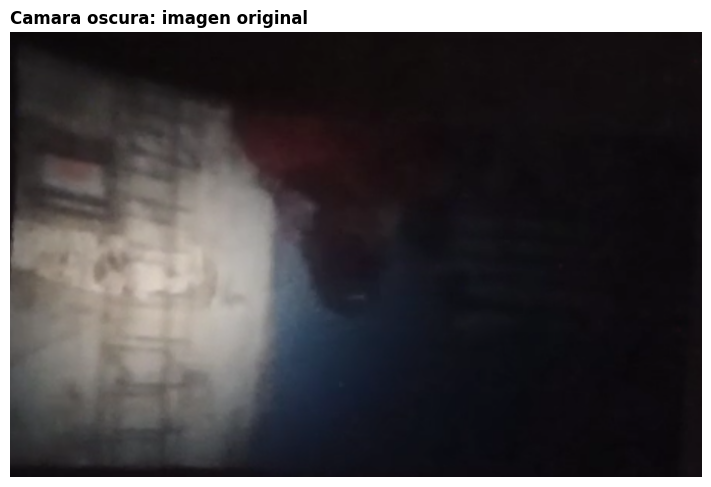

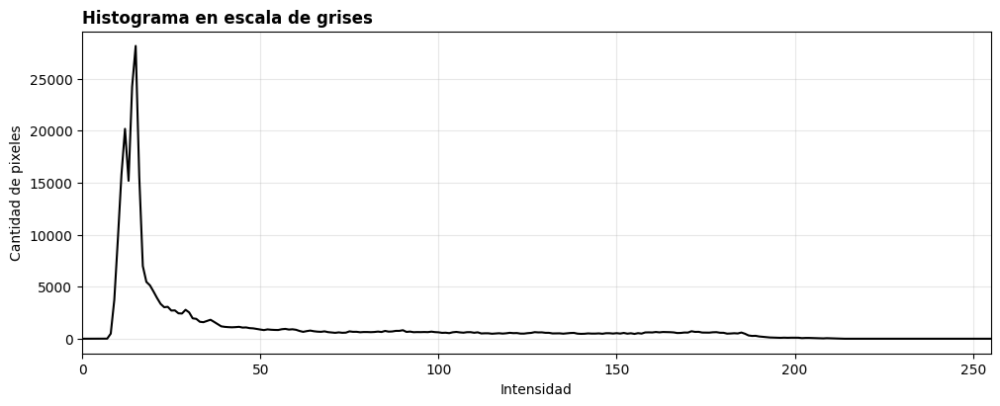

Diagnostico inicial: imagen muy oscura, bajo contraste, iluminación despareja, poca nitidez, posible orientación/inversión, mucha zona sin información útil.
Primera hipotesis: Corregir orientación, recortar la región útil, ajuste lineal de brillo y contraste


In [ ]:
nombre_imagen_camara_oscura = "CajaOscura 7.png"

# Inicializamos la variable de imagen
imagen_camara_oscura_rgb = None

# Cargamos la imagen
if nombre_imagen_camara_oscura != "":
    ruta_camara_oscura = carpeta_imagenes_tfi / nombre_imagen_camara_oscura
    imagen_camara_oscura_rgb = cargar_rgb(ruta_camara_oscura)

    # Mostramos la imagen original y su histograma para empezar el diagnostico.
    mostrar_imagen(imagen_camara_oscura_rgb, "Camara oscura: imagen original")
    mostrar_histograma_gris(imagen_camara_oscura_rgb)

# Detallamos diagnóstico inicial
diagnostico_camara_oscura = "Imagen muy oscura, bajo contraste, iluminación despareja, poca nitidez, posible orientación/inversión, mucha zona sin información útil."

# Primera hipotesis de mejora
hipotesis_camara_oscura = "Corregir orientación, recortar la región útil, ajuste lineal de brillo y contraste"

print("Diagnostico inicial:", diagnostico_camara_oscura)
print("Primera hipotesis:", hipotesis_camara_oscura)


### Estrategia 1 para camara oscura

Completa este bloque con una primera via de mejora. Conviene que hagas visible cada paso y que lo nombres con claridad.


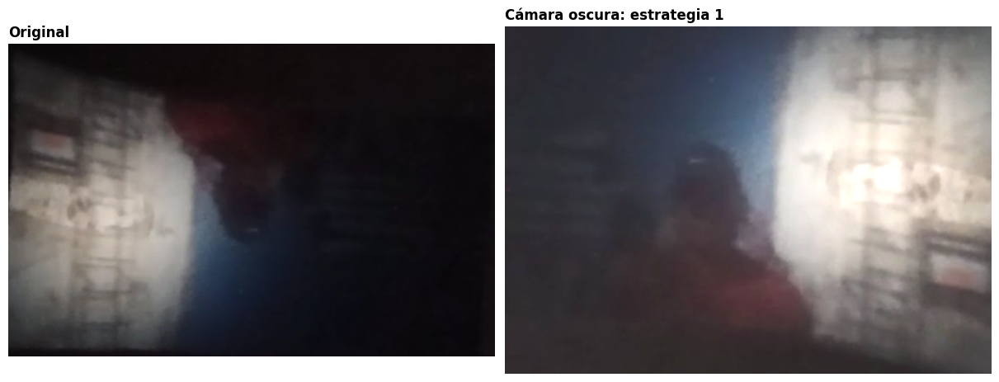

Esta estrategia corrige la orientación de la proyección, recorta la zona útil y aplica un ajuste lineal de brillo y contraste para mejorar la lectura general de una imagen oscura y de bajo contraste. Es una primera mejora simple: aumenta la visibilidad, aunque no recupera nitidez perdida ni corrige por completo la iluminación desigual.


In [ ]:
# Partimos de una copia de la imagen original
imagen_camara_estrategia_1 = None

if imagen_camara_oscura_rgb is not None:
    # Corregimos la orientación de la imagen de cámara oscura
    imagen_orientada = cv2.rotate(imagen_camara_oscura_rgb, cv2.ROTATE_180)

    # Recortamos la región útil para quitar bordes oscuros o zonas que no aportan al análisis
    alto, ancho = imagen_orientada.shape[:2]

    y_inicio = int(alto * 0.08)
    y_fin = int(alto * 0.92)
    x_inicio = int(ancho * 0.20)
    x_fin = int(ancho * 0.96)

    imagen_recortada = imagen_orientada[y_inicio:y_fin, x_inicio:x_fin]

    # Aplicamos un ajuste lineal de contraste y brillo.
    alpha_contraste = 1.2
    beta_brillo = 28

    imagen_camara_estrategia_1 = cv2.convertScaleAbs(
        imagen_recortada,
        alpha=alpha_contraste,
        beta=beta_brillo
    )

    # Mostramos la comparación
    mostrar_comparacion(
        imagen_camara_oscura_rgb,
        imagen_camara_estrategia_1,
        "Original",
        "Cámara oscura: estrategia 1"
    )

# Detallamos el resultado observado
observacion_camara_estrategia_1 = (
    "Esta estrategia corrige la orientación de la proyección, recorta la zona útil "
    "y aplica un ajuste lineal de brillo y contraste para mejorar la lectura general "
    "de una imagen oscura y de bajo contraste. Es una primera mejora simple: aumenta "
    "la visibilidad, aunque no recupera nitidez perdida ni corrige por completo la iluminación desigual."
)

print(observacion_camara_estrategia_1)



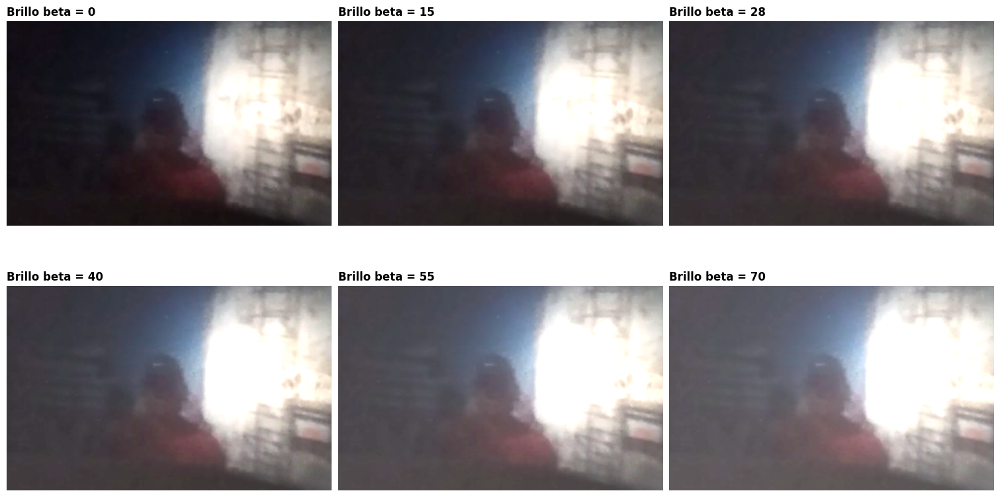

In [ ]:
# Comparación de varios niveles de brillo para elegir el más adecuado
if imagen_camara_oscura_rgb is not None:
    # Corregimos orientación
    imagen_orientada = cv2.rotate(imagen_camara_oscura_rgb, cv2.ROTATE_180)

    # Recortamos la región útil
    alto, ancho = imagen_orientada.shape[:2]

    y_inicio = int(alto * 0.08)
    y_fin = int(alto * 0.92)
    x_inicio = int(ancho * 0.10)
    x_fin = int(ancho * 0.96)

    imagen_recortada = imagen_orientada[y_inicio:y_fin, x_inicio:x_fin]

    # Definimos un contraste fijo y varios valores de brillo
    alpha_contraste = 1.45
    valores_brillo = [0, 15, 28, 40, 55, 70]

    imagenes_prueba = []
    titulos_prueba = []

    for beta_brillo in valores_brillo:
        imagen_ajustada = cv2.convertScaleAbs(
            imagen_recortada,
            alpha=alpha_contraste,
            beta=beta_brillo
        )

        imagenes_prueba.append(imagen_ajustada)
        titulos_prueba.append(f"Brillo beta = {beta_brillo}")

    # Mostramos todas las variantes juntas para comparar
    figura, ejes = plt.subplots(2, 3, figsize=(15, 8), constrained_layout=True)
    ejes = ejes.ravel()

    for eje, imagen_prueba, titulo in zip(ejes, imagenes_prueba, titulos_prueba):
        eje.imshow(imagen_prueba)
        eje.set_title(titulo, fontweight="bold", loc="left")
        eje.axis("off")

    plt.show()


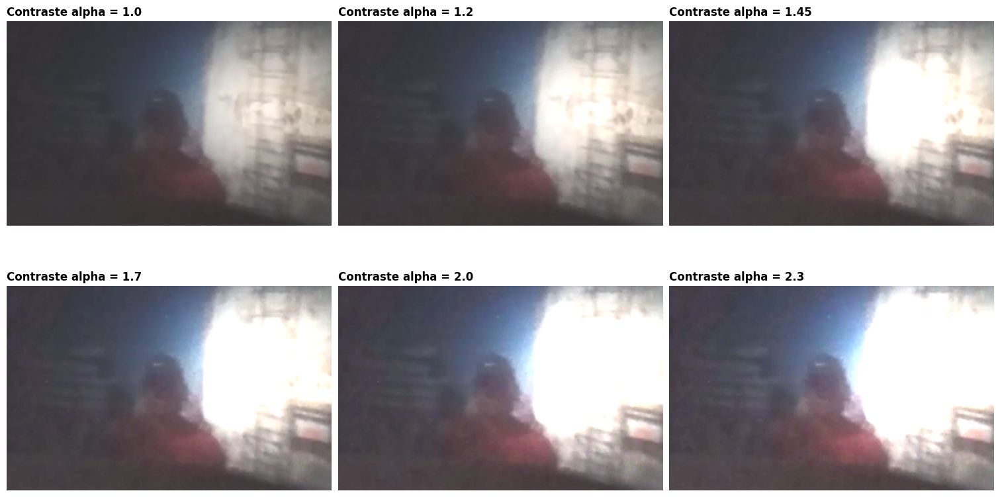

In [ ]:
# Comparación de varios niveles de contraste para elegir el más adecuado

if imagen_camara_oscura_rgb is not None:
    # Corregimos orientación.
    imagen_orientada = cv2.rotate(imagen_camara_oscura_rgb, cv2.ROTATE_180)

    # Recortamos la región útil.
    alto, ancho = imagen_orientada.shape[:2]

    y_inicio = int(alto * 0.08)
    y_fin = int(alto * 0.92)
    x_inicio = int(ancho * 0.10)
    x_fin = int(ancho * 0.96)

    imagen_recortada = imagen_orientada[y_inicio:y_fin, x_inicio:x_fin]

    # Definimos un brillo fijo y varios valores de contraste.
    beta_brillo = 40
    valores_contraste = [1.0, 1.2, 1.45, 1.7, 2.0, 2.3]

    imagenes_prueba = []
    titulos_prueba = []

    for alpha_contraste in valores_contraste:
        imagen_ajustada = cv2.convertScaleAbs(
            imagen_recortada,
            alpha=alpha_contraste,
            beta=beta_brillo
        )

        imagenes_prueba.append(imagen_ajustada)
        titulos_prueba.append(f"Contraste alpha = {alpha_contraste}")

    # Mostramos todas las variantes juntas para comparar.
    figura, ejes = plt.subplots(2, 3, figsize=(15, 8), constrained_layout=True)
    ejes = ejes.ravel()

    for eje, imagen_prueba, titulo in zip(ejes, imagenes_prueba, titulos_prueba):
        eje.imshow(imagen_prueba)
        eje.set_title(titulo, fontweight="bold", loc="left")
        eje.axis("off")

    plt.show()


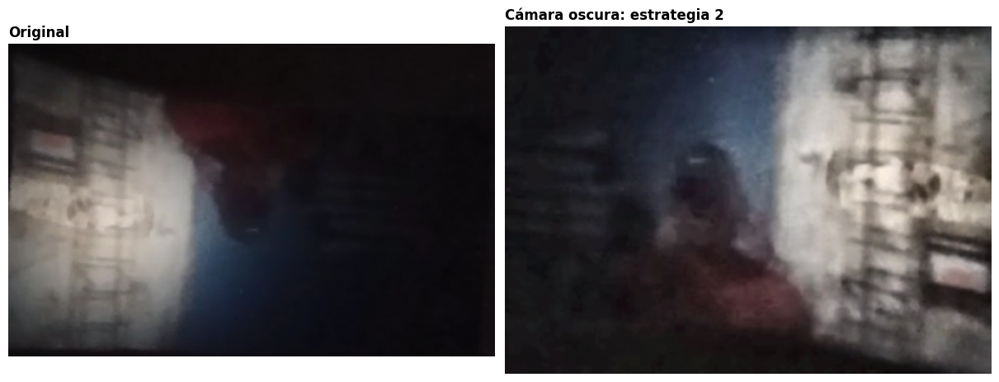

Esta estrategia usa CLAHE sobre el canal de luminosidad para mejorar el contraste local sin modificar directamente los colores. Luego aplica un suavizado leve para reducir pequeñas variaciones visibles. Es una alternativa más localizada que el ajuste lineal de brillo y contraste, por eso puede funcionar mejor cuando la iluminación de la cámara oscura es irregular.


In [ ]:
# Construimos la segunda estrategia
imagen_camara_estrategia_2 = None

if imagen_camara_oscura_rgb is not None:
    # Corregimos la orientación igual que en la estrategia 1
    imagen_orientada = cv2.rotate(imagen_camara_oscura_rgb, cv2.ROTATE_180)

    # Recortamos la misma región útil
    alto, ancho = imagen_orientada.shape[:2]

    y_inicio = int(alto * 0.08)
    y_fin = int(alto * 0.92)
    x_inicio = int(ancho * 0.20)
    x_fin = int(ancho * 0.96)

    imagen_recortada = imagen_orientada[y_inicio:y_fin, x_inicio:x_fin]

    # Convertimos la imagen de RGB a LAB.
    imagen_lab = cv2.cvtColor(imagen_recortada, cv2.COLOR_RGB2LAB)

    canal_l, canal_a, canal_b = cv2.split(imagen_lab)

    # Aplicamos CLAHE sobre el canal L.
    clahe = cv2.createCLAHE(
        clipLimit=3.0,
        tileGridSize=(8, 8)
    )

    canal_l_mejorado = clahe.apply(canal_l)

    # Volvemos a unir los canales LAB.
    imagen_lab_mejorada = cv2.merge([
        canal_l_mejorado,
        canal_a,
        canal_b
    ])

    # Convertimos nuevamente de LAB a RGB para visualizar correctamente.
    imagen_clahe_rgb = cv2.cvtColor(imagen_lab_mejorada, cv2.COLOR_LAB2RGB)

    # Aplicamos un suavizado leve.
    imagen_camara_estrategia_2 = cv2.GaussianBlur(
        imagen_clahe_rgb,
        (3, 3),
        0
    )

    # Mostramos la comparación entre la imagen original y la estrategia 2.
    mostrar_comparacion(
        imagen_camara_oscura_rgb,
        imagen_camara_estrategia_2,
        "Original",
        "Cámara oscura: estrategia 2"
    )

# Detallamos observacion de la segunda estrategia
observacion_camara_estrategia_2 = (
    "Esta estrategia usa CLAHE sobre el canal de luminosidad para mejorar el contraste local "
    "sin modificar directamente los colores. Luego aplica un suavizado leve para reducir pequeñas "
    "variaciones visibles. Es una alternativa más localizada que el ajuste lineal de brillo y contraste, "
    "por eso puede funcionar mejor cuando la iluminación de la cámara oscura es irregular."
)

print(observacion_camara_estrategia_2)


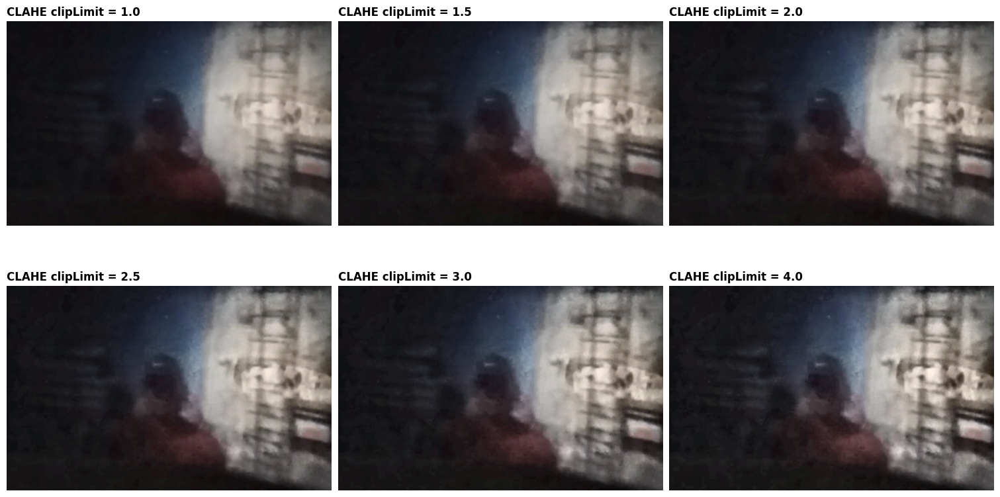

In [ ]:
# Comparación de distintos niveles de CLAHE para elegir el más adecuado

if imagen_camara_oscura_rgb is not None:
    # Corregimos orientación
    imagen_orientada = cv2.rotate(imagen_camara_oscura_rgb, cv2.ROTATE_180)

    # Recortamos la misma región útil usada en las estrategias
    alto, ancho = imagen_orientada.shape[:2]

    y_inicio = int(alto * 0.08)
    y_fin = int(alto * 0.92)
    x_inicio = int(ancho * 0.10)
    x_fin = int(ancho * 0.96)

    imagen_recortada = imagen_orientada[y_inicio:y_fin, x_inicio:x_fin]

    # Convertimos a LAB para aplicar CLAHE solo sobre la luminosidad
    imagen_lab = cv2.cvtColor(imagen_recortada, cv2.COLOR_RGB2LAB)
    canal_l, canal_a, canal_b = cv2.split(imagen_lab)

    # Probamos distintos niveles de CLAHE
    valores_clip_limit = [1.0, 1.5, 2.0, 2.5, 3.0, 4.0]

    imagenes_prueba = []
    titulos_prueba = []

    for clip in valores_clip_limit:
        clahe = cv2.createCLAHE(
            clipLimit=clip,
            tileGridSize=(8, 8)
        )

        canal_l_mejorado = clahe.apply(canal_l)

        imagen_lab_mejorada = cv2.merge([
            canal_l_mejorado,
            canal_a,
            canal_b
        ])

        imagen_clahe_rgb = cv2.cvtColor(imagen_lab_mejorada, cv2.COLOR_LAB2RGB)

        imagenes_prueba.append(imagen_clahe_rgb)
        titulos_prueba.append(f"CLAHE clipLimit = {clip}")

    # Mostramos todas las variantes juntas
    figura, ejes = plt.subplots(2, 3, figsize=(15, 8), constrained_layout=True)
    ejes = ejes.ravel()

    for eje, imagen_prueba, titulo in zip(ejes, imagenes_prueba, titulos_prueba):
        eje.imshow(imagen_prueba)
        eje.set_title(titulo, fontweight="bold", loc="left")
        eje.axis("off")

    plt.show()


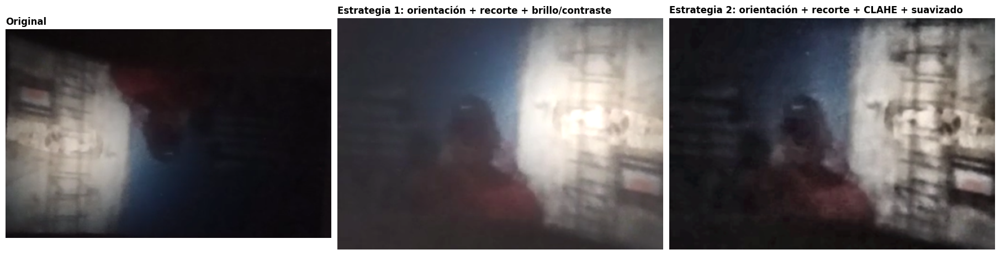

In [ ]:
# Comparación final entre la imagen original y las dos estrategias de cámara oscura

if (
    imagen_camara_oscura_rgb is not None
    and imagen_camara_estrategia_1 is not None
    and imagen_camara_estrategia_2 is not None
):
    figura, ejes = plt.subplots(1, 3, figsize=(18, 6), constrained_layout=True)

    imagenes = [
        imagen_camara_oscura_rgb,
        imagen_camara_estrategia_1,
        imagen_camara_estrategia_2
    ]

    titulos = [
        "Original",
        "Estrategia 1: orientación + recorte + brillo/contraste",
        "Estrategia 2: orientación + recorte + CLAHE + suavizado"
    ]

    for eje, imagen, titulo in zip(ejes, imagenes, titulos):
        eje.imshow(imagen)
        eje.set_title(titulo, fontweight="bold", loc="left")
        eje.axis("off")

    plt.show()

else:
    print("Primero ejecutá la carga de la imagen y las dos estrategias antes de comparar.")



## Elección final — Caso 1: Cámara oscura

Se elige la **estrategia 2, basada en mejora de contraste local mediante CLAHE aplicado sobre la luminancia**, precedida por la corrección de orientación y el recorte de la región útil.

### Justificación

Esta estrategia resulta más adecuada que el ajuste lineal global de brillo y contraste porque el problema principal de la imagen no es solo la oscuridad general, sino la **iluminación irregular y el bajo contraste local**.

El uso de CLAHE permite:
- mejorar el contraste en distintas regiones de la imagen de manera independiente;
- recuperar detalles en zonas oscuras sin saturar las zonas claras;
- mantener una apariencia más natural en comparación con ajustes globales.

En cambio, el ajuste lineal:
- actúa de forma uniforme sobre toda la imagen;
- puede provocar saturación en zonas claras;
- no resuelve correctamente la variabilidad de iluminación.

### Limitaciones

A pesar de la mejora obtenida, es importante destacar que:
- no se recupera la **nitidez original** de la imagen;
- no es posible reconstruir **información perdida** en zonas muy oscuras;
- el resultado depende de una elección adecuada de parámetros para evitar efectos artificiales.

Elección final: estrategia 2 - CLAHE sobre luminancia + suavizado leve.
Justificación: Se elige la estrategia 2 porque CLAHE mejora el contraste local de forma más controlada que el ajuste global de brillo y contraste. Permite distinguir mejor las zonas oscuras y claras sin saturar tanto la imagen. Su límite es que no recupera nitidez ni información perdida en la captura original.


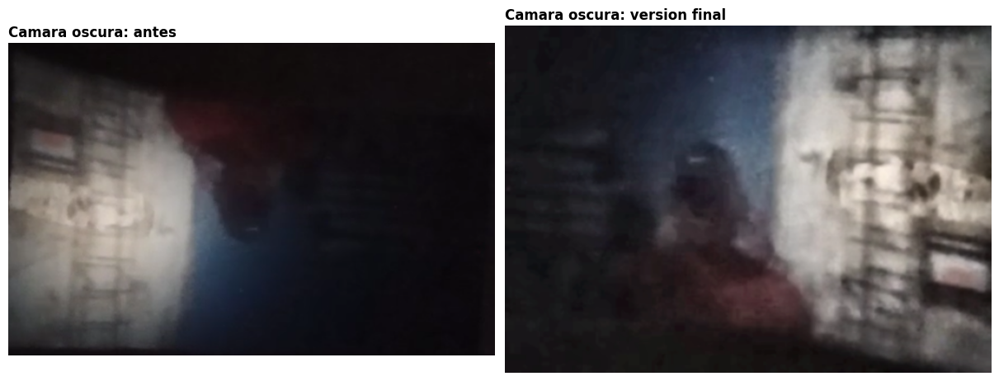

Salida guardada en: C:\Users\Tamara\Desktop\PDI 2026\rodriguez-carmen-pdi-1c-2026\006 - TFI_1\salidas_tfi1\camara_oscura_final.png


In [ ]:
# Elección final de estrategia
imagen_camara_final = imagen_camara_estrategia_2

# Justificación de la elección final
justificacion_camara_final = (
    "Se elige la estrategia 2 porque CLAHE mejora el contraste local de forma más controlada "
    "que el ajuste global de brillo y contraste. Permite distinguir mejor las zonas oscuras y claras "
    "sin saturar tanto la imagen. Su límite es que no recupera nitidez ni información perdida en la captura original."
)

print("Elección final: estrategia 2 - CLAHE sobre luminancia + suavizado leve.")
print("Justificación:", justificacion_camara_final)

# Guardamos la salida final
if imagen_camara_final is not None:
    ruta_salida_camara = carpeta_salidas_tfi / "camara_oscura_final.png"
    guardar_rgb(ruta_salida_camara, imagen_camara_final)

    if imagen_camara_oscura_rgb is not None:
        mostrar_comparacion(
            imagen_camara_oscura_rgb,
            imagen_camara_final,
            "Camara oscura: antes",
            "Camara oscura: version final"
        )

    print(f"Salida guardada en: {ruta_salida_camara.resolve()}")

## Caso 2. Imagen de medio grafico color

En este caso el problema puede estar en la geometria, en el contraste, en el color o en danos localizados. Antes de intervenir, conviene distinguir si el principal obstaculo es la perspectiva, la cromaticidad, la iluminacion o la presencia de manchas.

**Sugerencias tecnicas posibles:** rectificacion de perspectiva, mejora sobre HSV o LAB, `CLAHE`, suavizado e `inpainting` si hubiera dano localizado.


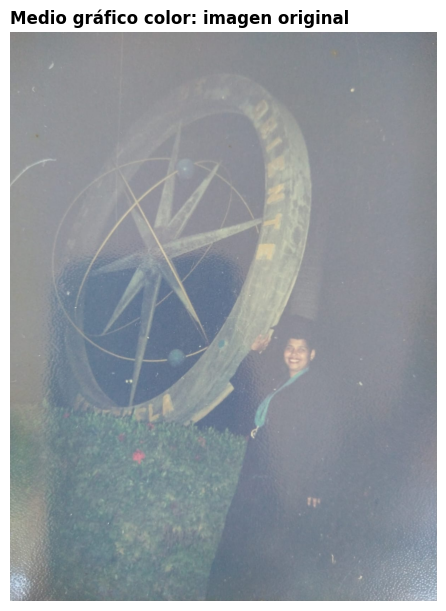

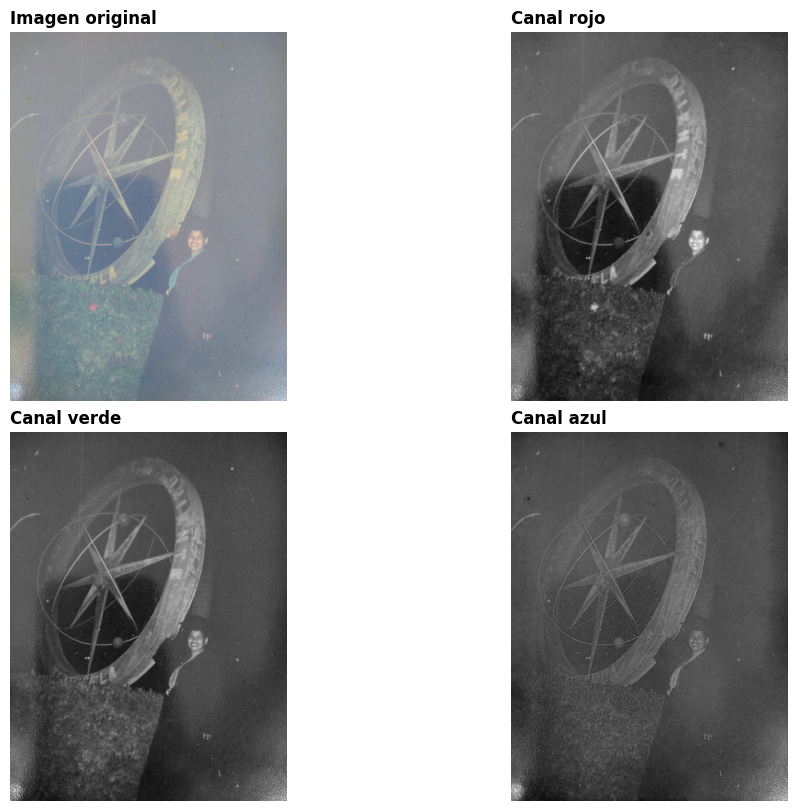

Diagnóstico inicial: colores apagados, bajo contraste, iluminación irregular, ruido y baja saturación
Objetivo de mejora: mejorar contraste y saturación de forma moderada, reduciendo ruido sin perder detalle


In [ ]:
nombre_imagen_medio_color = "UDO sola.jpeg"
imagen_medio_color_rgb = None

# Cargamos la imagen
if nombre_imagen_medio_color != "":
    ruta_medio_color = carpeta_imagenes_tfi / nombre_imagen_medio_color

    # Cargamos la imagen en formato RGB
    imagen_medio_color_rgb = cargar_rgb(ruta_medio_color)

    # Mostramos la imagen original
    mostrar_imagen(imagen_medio_color_rgb, "Medio gráfico color: imagen original")

    # Separamos los canales RGB y los mostramos
    mostrar_canales_rgb(imagen_medio_color_rgb)

# Registramos el diagnóstico inicial
diagnostico_medio_color = (
    "Colores apagados, bajo contraste, iluminación irregular, ruido y baja saturación"
)

# Definimos qué queremos priorizar en la mejora
objetivo_medio_color = (
    "Mejorar contraste y saturación de forma moderada, reduciendo ruido sin perder detalle"
)

print("Diagnóstico inicial:", diagnostico_medio_color)
print("Objetivo de mejora:", objetivo_medio_color)


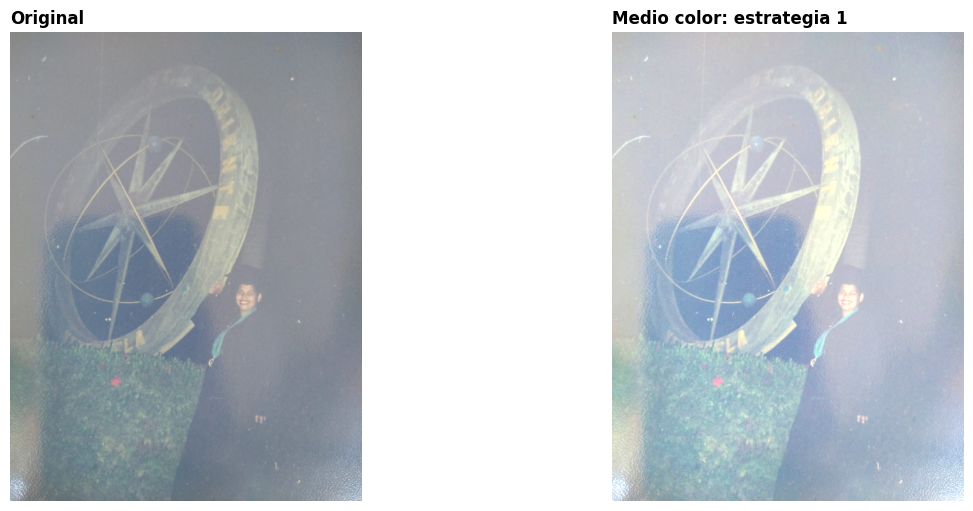

Esta estrategia aplica una mejora global sencilla: primero ajusta brillo y contraste para aumentar la visibilidad general, y luego refuerza la saturación en HSV para recuperar parte de los colores apagados. Se trabaja sobre una copia para preservar la imagen original y poder compararla luego con las versiones generadas. Es una estrategia directa y fácil de controlar, aunque puede seguir limitada por la iluminación irregular y por la baja nitidez.


In [ ]:
# Partimos de una copia de la imagen original
imagen_medio_color_estrategia_1 = None

if imagen_medio_color_rgb is not None:
    # Creamos una copia para preservar intacta la imagen original
    imagen_medio_color_estrategia_1 = imagen_medio_color_rgb.copy()

    # Aplicamos un ajuste lineal de brillo y contraste
    alpha_contraste = 1.25
    beta_brillo = 18

    imagen_ajustada = cv2.convertScaleAbs(
        imagen_medio_color_estrategia_1,
        alpha=alpha_contraste,
        beta=beta_brillo
    )

    # Convertimos la imagen ajustada de RGB a HSV
    imagen_hsv = cv2.cvtColor(imagen_ajustada, cv2.COLOR_RGB2HSV)

    canal_h, canal_s, canal_v = cv2.split(imagen_hsv)

    # Aumentamos la saturación de forma moderada
    factor_saturacion = 1.25

    canal_s_mejorado = cv2.convertScaleAbs(
        canal_s,
        alpha=factor_saturacion,
        beta=0
    )

    # Unimos nuevamente los canales HSV
    imagen_hsv_mejorada = cv2.merge([
        canal_h,
        canal_s_mejorado,
        canal_v
    ])

    # Volvemos a RGB para visualizar correctamente
    imagen_medio_color_estrategia_1 = cv2.cvtColor(
        imagen_hsv_mejorada,
        cv2.COLOR_HSV2RGB
    )

    # Mostramos la comparación para evaluar
    mostrar_comparacion(
        imagen_medio_color_rgb,
        imagen_medio_color_estrategia_1,
        "Original",
        "Medio color: estrategia 1"
    )

observacion_medio_color_estrategia_1 = (
    "Esta estrategia aplica una mejora global sencilla: primero ajusta brillo y contraste "
    "para aumentar la visibilidad general, y luego refuerza la saturación en HSV para recuperar "
    "parte de los colores apagados. Se trabaja sobre una copia para preservar la imagen original "
    "y poder compararla luego con las versiones generadas. Es una estrategia directa y fácil de "
    "controlar, aunque puede seguir limitada por la iluminación irregular y por la baja nitidez."
)

print(observacion_medio_color_estrategia_1)




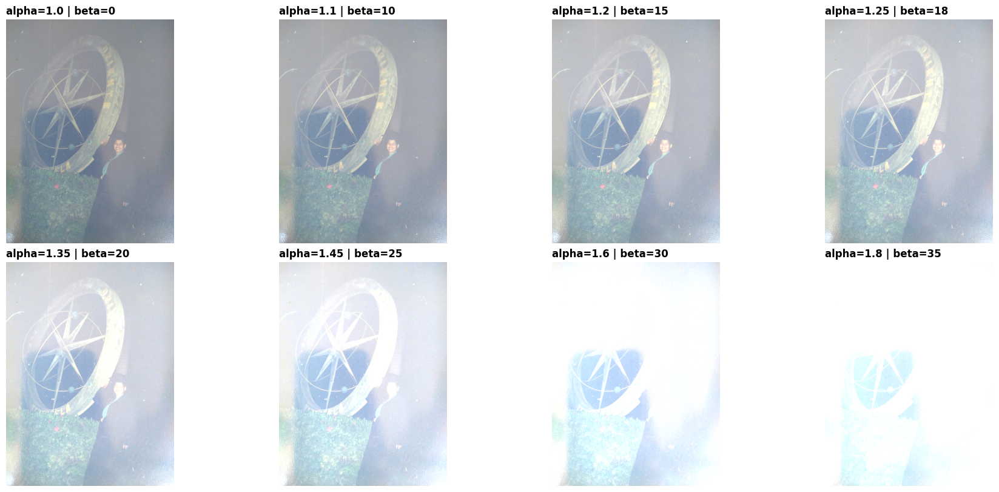

In [ ]:
# Comparación de distintos niveles de brillo y contraste para la estrategia 1

if imagen_medio_color_rgb is not None:
    # Trabajamos sobre una copia para no modificar la imagen original
    imagen_base = imagen_medio_color_rgb.copy()

    # Definimos varias combinaciones de contraste y brillo
    combinaciones = [
        (1.00, 0),
        (1.10, 10),
        (1.20, 15),
        (1.25, 18),
        (1.35, 20),
        (1.45, 25),
        (1.60, 30),
        (1.80, 35),
    ]

    imagenes_prueba = []
    titulos_prueba = []

    for alpha_contraste, beta_brillo in combinaciones:
        imagen_ajustada = cv2.convertScaleAbs(
            imagen_base,
            alpha=alpha_contraste,
            beta=beta_brillo
        )

        imagenes_prueba.append(imagen_ajustada)
        titulos_prueba.append(f"alpha={alpha_contraste} | beta={beta_brillo}")

    # Mostramos las variantes para comparar
    figura, ejes = plt.subplots(2, 4, figsize=(18, 8), constrained_layout=True)
    ejes = ejes.ravel()

    for eje, imagen_prueba, titulo in zip(ejes, imagenes_prueba, titulos_prueba):
        eje.imshow(imagen_prueba)
        eje.set_title(titulo, fontweight="bold", loc="left")
        eje.axis("off")

    plt.show()
else:
    print("Primero cargá la imagen del medio gráfico color.")


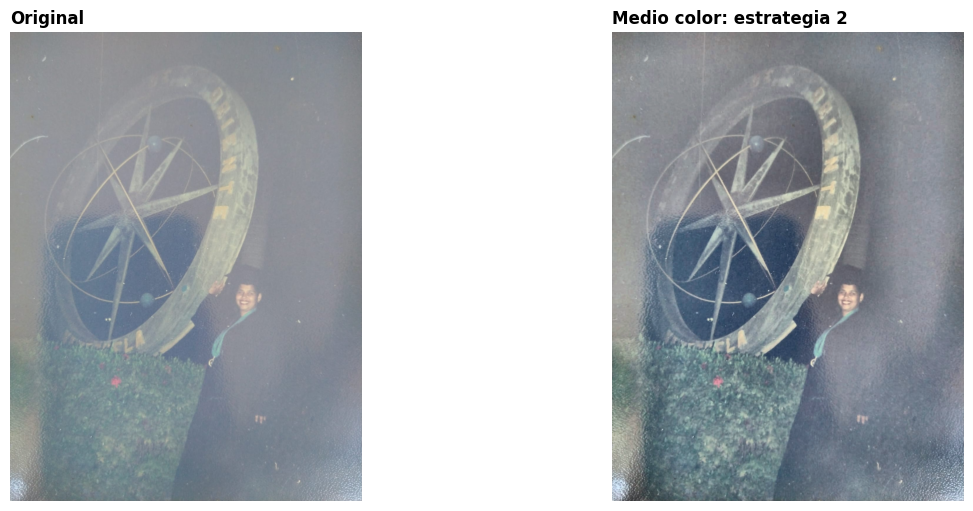

Esta estrategia mejora primero el contraste local aplicando CLAHE sobre el canal L de LAB, lo que permite trabajar la luminosidad sin alterar directamente los colores. Luego aumenta la saturación de forma moderada para recuperar parte del color apagado y finalmente aplica un denoise leve con filtro bilateral para reducir ruido sin perder demasiados bordes.
Se elige la estrategia 2 porque responde mejor al problema principal de la imagen: bajo contraste, colores apagados e iluminación irregular. CLAHE mejora la luminosidad local sin forzar toda la imagen por igual, el ajuste de saturación recupera color de manera moderada y el filtro bilateral reduce ruido sin borrar por completo los detalles. La mejora mantiene límites: no recupera nitidez perdida ni elimina totalmente el deterioro del soporte.


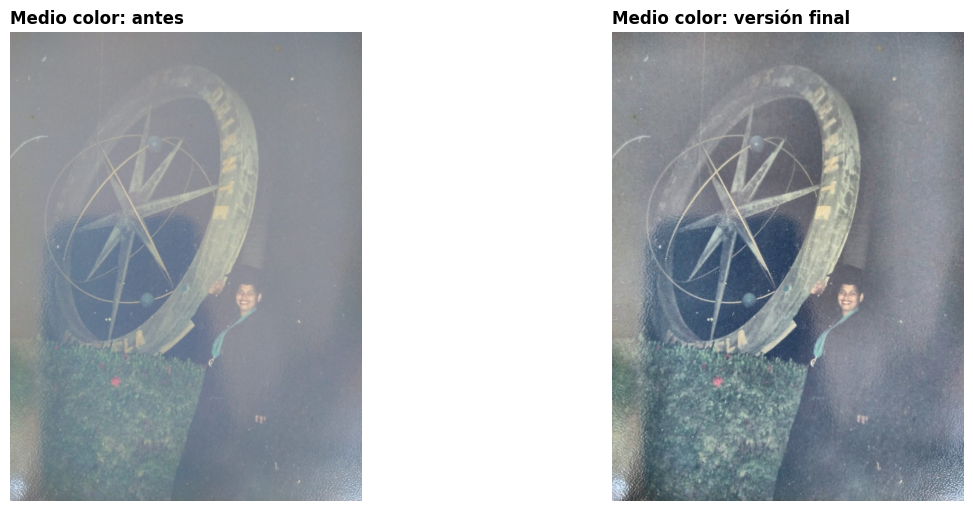

Salida guardada en: C:\Users\Tamara\Desktop\PDI 2026\rodriguez-carmen-pdi-1c-2026\006 - TFI_1\salidas_tfi1\medio_grafico_color_final.png


In [ ]:
# Construimos una segunda estrategia para poder realizar comparaciones
imagen_medio_color_estrategia_2 = None

if imagen_medio_color_rgb is not None:
    # Creamos una copia para preservar intacta la imagen original
    imagen_medio_color_estrategia_2 = imagen_medio_color_rgb.copy()

    # Convertimos de RGB a LAB.
    imagen_lab = cv2.cvtColor(imagen_medio_color_estrategia_2, cv2.COLOR_RGB2LAB)

    canal_l, canal_a, canal_b = cv2.split(imagen_lab)

    # Aplicamos CLAHE sobre el canal L
    clahe = cv2.createCLAHE(
        clipLimit=2.0,
        tileGridSize=(8, 8)
    )

    canal_l_mejorado = clahe.apply(canal_l)

    # Volvemos a unir los canales LAB
    imagen_lab_mejorada = cv2.merge([
        canal_l_mejorado,
        canal_a,
        canal_b
    ])

    # Convertimos nuevamente a RGB
    imagen_clahe_rgb = cv2.cvtColor(imagen_lab_mejorada, cv2.COLOR_LAB2RGB)

    # Convertimos a HSV para ajustar la saturación
    imagen_hsv = cv2.cvtColor(imagen_clahe_rgb, cv2.COLOR_RGB2HSV)

    canal_h, canal_s, canal_v = cv2.split(imagen_hsv)

    # Aumentamos la saturación de manera moderada
    factor_saturacion = 1.18

    canal_s_mejorado = cv2.convertScaleAbs(
        canal_s,
        alpha=factor_saturacion,
        beta=0
    )

    imagen_hsv_mejorada = cv2.merge([
        canal_h,
        canal_s_mejorado,
        canal_v
    ])

    imagen_saturada_rgb = cv2.cvtColor(
        imagen_hsv_mejorada,
        cv2.COLOR_HSV2RGB
    )

    # Aplicamos una reducción de ruido leve
    imagen_medio_color_estrategia_2 = cv2.bilateralFilter(
        imagen_saturada_rgb,
        d=5,
        sigmaColor=35,
        sigmaSpace=35
    )

    # Mostramos la comparación entre la original y la estrategia 2
    mostrar_comparacion(
        imagen_medio_color_rgb,
        imagen_medio_color_estrategia_2,
        "Original",
        "Medio color: estrategia 2"
    )

observacion_medio_color_estrategia_2 = (
    "Esta estrategia mejora primero el contraste local aplicando CLAHE sobre el canal L de LAB, "
    "lo que permite trabajar la luminosidad sin alterar directamente los colores. Luego aumenta "
    "la saturación de forma moderada para recuperar parte del color apagado y finalmente aplica "
    "un denoise leve con filtro bilateral para reducir ruido sin perder demasiados bordes."
)

print(observacion_medio_color_estrategia_2)

# Eleccion de estrategia final que nos dejó el mejor resultado
imagen_medio_color_final = imagen_medio_color_estrategia_2

# Guardamos la justificacion
justificacion_medio_color_final = (
    "Se elige la estrategia 2 porque responde mejor al problema principal de la imagen: bajo contraste, "
    "colores apagados e iluminación irregular. CLAHE mejora la luminosidad local sin forzar toda la imagen "
    "por igual, el ajuste de saturación recupera color de manera moderada y el filtro bilateral reduce ruido "
    "sin borrar por completo los detalles. La mejora mantiene límites: no recupera nitidez perdida ni elimina "
    "totalmente el deterioro del soporte."
)

print(justificacion_medio_color_final)

# Guardamos la salida final
if imagen_medio_color_final is not None:
    ruta_salida_medio_color = carpeta_salidas_tfi / "medio_grafico_color_final.png"
    guardar_rgb(ruta_salida_medio_color, imagen_medio_color_final)

    if imagen_medio_color_rgb is not None:
        mostrar_comparacion(
            imagen_medio_color_rgb,
            imagen_medio_color_final,
            "Medio color: antes",
            "Medio color: versión final"
        )

    print(f"Salida guardada en: {ruta_salida_medio_color.resolve()}")


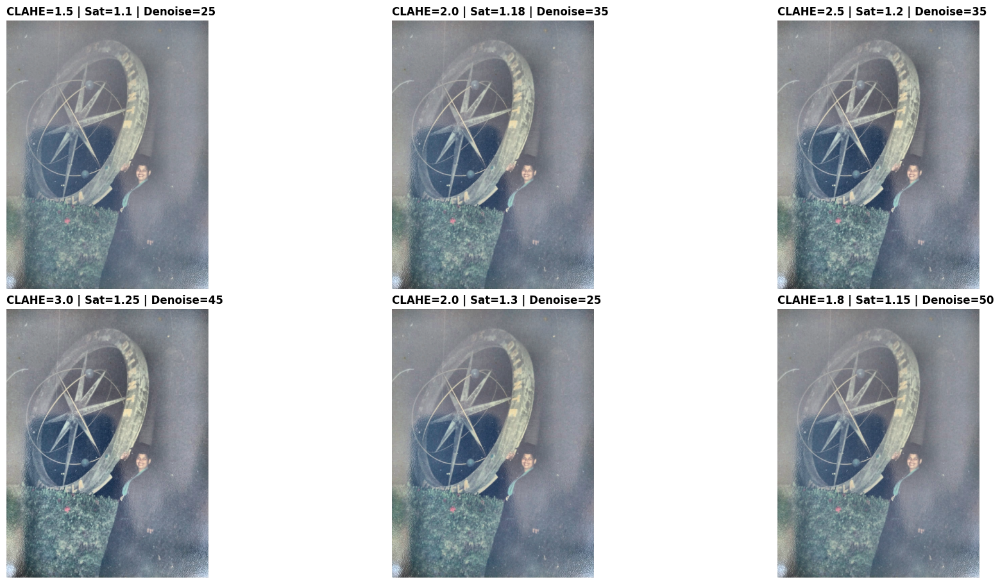

In [ ]:
# Comparación de variantes para la estrategia 2:
if imagen_medio_color_rgb is not None:
    # Trabajamos sobre una copia
    imagen_base = imagen_medio_color_rgb.copy()

    # Definimos combinaciones razonables
    variantes = [
        {
            "clipLimit": 1.5,
            "factor_saturacion": 1.10,
            "sigma_bilateral": 25
        },
        {
            "clipLimit": 2.0,
            "factor_saturacion": 1.18,
            "sigma_bilateral": 35
        },
        {
            "clipLimit": 2.5,
            "factor_saturacion": 1.20,
            "sigma_bilateral": 35
        },
        {
            "clipLimit": 3.0,
            "factor_saturacion": 1.25,
            "sigma_bilateral": 45
        },
        {
            "clipLimit": 2.0,
            "factor_saturacion": 1.30,
            "sigma_bilateral": 25
        },
        {
            "clipLimit": 1.8,
            "factor_saturacion": 1.15,
            "sigma_bilateral": 50
        },
    ]

    imagenes_prueba = []
    titulos_prueba = []

    for variante in variantes:
        clip_limit = variante["clipLimit"]
        factor_saturacion = variante["factor_saturacion"]
        sigma_bilateral = variante["sigma_bilateral"]

        # Convertimos de RGB a LAB para mejorar solo la luminosidad
        imagen_lab = cv2.cvtColor(imagen_base, cv2.COLOR_RGB2LAB)
        canal_l, canal_a, canal_b = cv2.split(imagen_lab)

        # Aplicamos CLAHE sobre L
        clahe = cv2.createCLAHE(
            clipLimit=clip_limit,
            tileGridSize=(8, 8)
        )

        canal_l_mejorado = clahe.apply(canal_l)

        imagen_lab_mejorada = cv2.merge([
            canal_l_mejorado,
            canal_a,
            canal_b
        ])

        imagen_clahe_rgb = cv2.cvtColor(
            imagen_lab_mejorada,
            cv2.COLOR_LAB2RGB
        )

        # Ajustamos saturación en HSV
        imagen_hsv = cv2.cvtColor(imagen_clahe_rgb, cv2.COLOR_RGB2HSV)
        canal_h, canal_s, canal_v = cv2.split(imagen_hsv)

        canal_s_mejorado = cv2.convertScaleAbs(
            canal_s,
            alpha=factor_saturacion,
            beta=0
        )

        imagen_hsv_mejorada = cv2.merge([
            canal_h,
            canal_s_mejorado,
            canal_v
        ])

        imagen_saturada_rgb = cv2.cvtColor(
            imagen_hsv_mejorada,
            cv2.COLOR_HSV2RGB
        )

        # Aplicamos denoise leve con filtro bilateral
        imagen_resultado = cv2.bilateralFilter(
            imagen_saturada_rgb,
            d=5,
            sigmaColor=sigma_bilateral,
            sigmaSpace=sigma_bilateral
        )

        imagenes_prueba.append(imagen_resultado)
        titulos_prueba.append(
            f"CLAHE={clip_limit} | Sat={factor_saturacion} | Denoise={sigma_bilateral}"
        )

    # Mostramos las variantes para comparar
    figura, ejes = plt.subplots(2, 3, figsize=(18, 9), constrained_layout=True)
    ejes = ejes.ravel()

    for eje, imagen_prueba, titulo in zip(ejes, imagenes_prueba, titulos_prueba):
        eje.imshow(imagen_prueba)
        eje.set_title(titulo, fontweight="bold", loc="left")
        eje.axis("off")

    plt.show()

else:
    print("Primero cargá la imagen del medio gráfico color.")


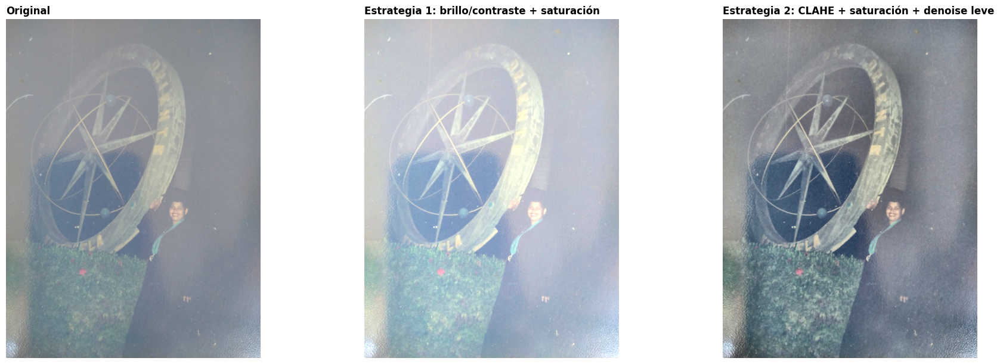


Elección final: estrategia 2 - CLAHE + saturación + denoise leve.
Justificación: Se elige la estrategia 2 porque mejora el contraste local sin sobreexponer la imagen, conservando mejor los detalles en zonas claras y oscuras. Además, el ajuste de saturación recupera el color y el denoise leve reduce el ruido sin borrar estructura. Su límite es que puede hacer más visible la textura del soporte y no recupera nitidez perdida.


In [ ]:
# Comparación final entre la imagen original y las dos estrategias del medio gráfico color

if (
    imagen_medio_color_rgb is not None
    and imagen_medio_color_estrategia_1 is not None
    and imagen_medio_color_estrategia_2 is not None
):
    figura, ejes = plt.subplots(1, 3, figsize=(18, 6), constrained_layout=True)

    imagenes = [
        imagen_medio_color_rgb,
        imagen_medio_color_estrategia_1,
        imagen_medio_color_estrategia_2
    ]

    titulos = [
        "Original",
        "Estrategia 1: brillo/contraste + saturación",
        "Estrategia 2: CLAHE + saturación + denoise leve"
    ]

    for eje, imagen, titulo in zip(ejes, imagenes, titulos):
        eje.imshow(imagen)
        eje.set_title(titulo, fontweight="bold", loc="left")
        eje.axis("off")

    plt.show()

    imagen_medio_color_final = imagen_medio_color_estrategia_2

    justificacion_medio_color_final = (
        "Se elige la estrategia 2 porque mejora el contraste local sin sobreexponer la imagen, "
        "conservando mejor los detalles en zonas claras y oscuras. Además, el ajuste de saturación "
        "recupera el color y el denoise leve reduce el ruido sin borrar estructura. Su límite es que "
        "puede hacer más visible la textura del soporte y no recupera nitidez perdida."
    )

    print("\nElección final: estrategia 2 - CLAHE + saturación + denoise leve.")
    print("Justificación:", justificacion_medio_color_final)

else:
    print("Primero ejecutá la carga de la imagen y las dos estrategias del medio gráfico color.")

## Elección final — Caso 2: Medio gráfico color

Se elige la **estrategia 2: CLAHE sobre luminancia + ajuste de saturación + reducción de ruido leve**.

### Justificación

Esta estrategia resulta más adecuada porque el problema principal de la imagen combina **bajo contraste, colores apagados e iluminación irregular**.

El uso de CLAHE sobre luminancia permite:
- mejorar el contraste de forma local;
- evitar lavar las zonas claras como ocurre con el ajuste global;
- conservar mejor la separación entre objetos (rueda, fondo, vegetación).

El ajuste de saturación complementa la mejora recuperando intensidad de color, mientras que el denoise leve reduce el ruido sin eliminar demasiado detalle.

En comparación, la estrategia 1:
- mejora la visibilidad general;
- pero actúa de forma global, generando zonas sobreexpuestas y pérdida de detalle fino.

### Limitaciones

- La mejora de contraste local puede hacer más visible el **ruido o la textura del soporte**.
- No se recupera la **nitidez original** ni los detalles perdidos.
- Requiere parámetros moderados para evitar resultados artificiales.

## Caso 3. Imagen de medio grafico blanco/negro

En este caso suele importar la legibilidad. El objetivo es separar de manera razonable el fondo y los trazos, sin borrar informacion importante. Por eso conviene pensar si necesitas trabajar en grises, suavizar, umbralizar y limpiar la mascara resultante.

**Sugerencias tecnicas posibles:** conversion a grises, suavizado, umbral global, `Otsu`, `adaptiveThreshold`, apertura o clausura morfologica.


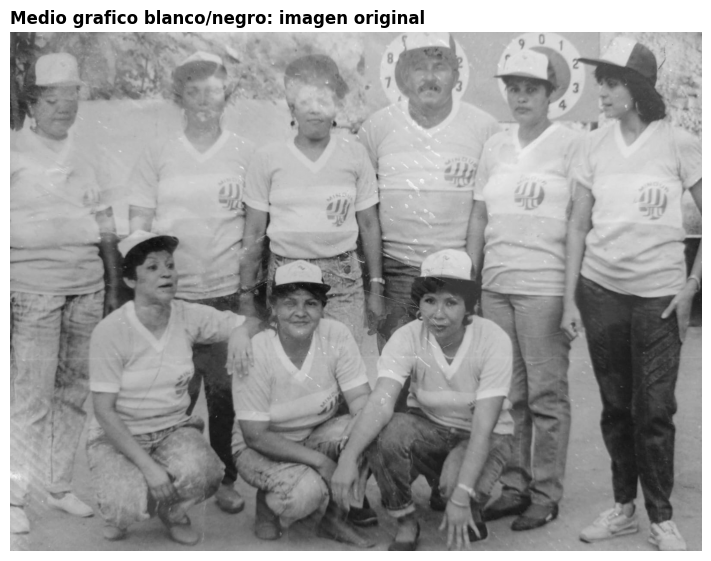

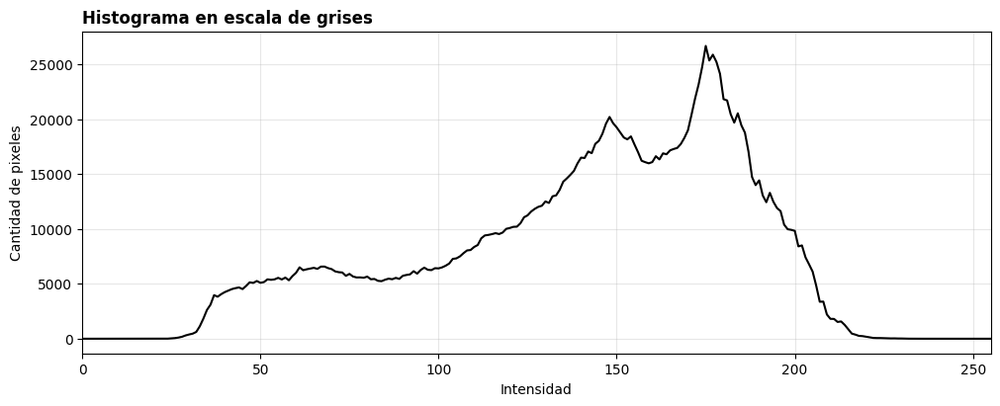

Diagnostico inicial: bajo contraste, imagen lavada, manchas, rayas y suciedad, zonas claras con poca textura
Objetivo de mejora: Suavizado leve para reducir ruido, ecualización global.


In [ ]:
nombre_imagen_medio_bn = "DreamTeam ByN.jpeg"

# Inicializamos la variable de imagen
imagen_medio_bn_gris = None

# Cargamos la imagen
if nombre_imagen_medio_bn != "":
    ruta_medio_bn = carpeta_imagenes_tfi / nombre_imagen_medio_bn
    imagen_medio_bn_gris = cargar_gris(ruta_medio_bn)

    # Mostramos la imagen original y su histograma
    mostrar_imagen(imagen_medio_bn_gris, "Medio grafico blanco/negro: imagen original")
    mostrar_histograma_gris(imagen_medio_bn_gris)

# Problema principal detectado
diagnostico_medio_bn = "Bajo contraste, imagen lavada, manchas, rayas y suciedad, zonas claras con poca textura"

# Mejora esperada
objetivo_medio_bn = "Suavizado leve para reducir ruido, ecualización global."

print("Diagnostico inicial:", diagnostico_medio_bn)
print("Objetivo de mejora:", objetivo_medio_bn)


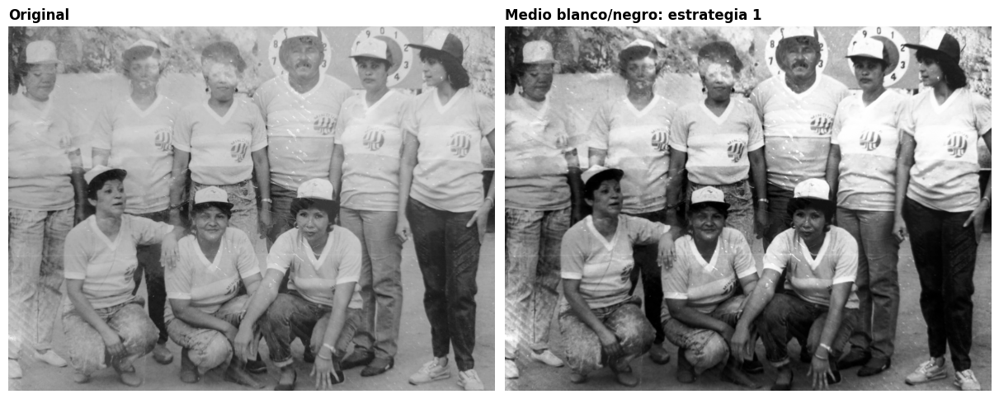

Esta estrategia aplica un suavizado leve para reducir ruido o grano antes de mejorar el contraste. Luego usa ecualización global del histograma para redistribuir las intensidades y hacer más visibles los detalles generales de la imagen. Es una mejora simple y global, aunque puede aumentar la visibilidad de manchas, rayas o imperfecciones del soporte.


In [ ]:
# Estrategia 1
imagen_medio_bn_estrategia_1 = None

if imagen_medio_bn_gris is not None:
    # Creamos una copia
    imagen_medio_bn_estrategia_1 = imagen_medio_bn_gris.copy()

    # Aplicamos un suavizado leve
    imagen_suavizada = cv2.GaussianBlur(
        imagen_medio_bn_estrategia_1,
        (3, 3),
        0
    )

    # Aplicamos ecualización global del histograma
    imagen_medio_bn_estrategia_1 = cv2.equalizeHist(imagen_suavizada)

    # Mostramos la comparación para evaluar la mejora tonal general
    mostrar_comparacion(
        imagen_medio_bn_gris,
        imagen_medio_bn_estrategia_1,
        "Original",
        "Medio blanco/negro: estrategia 1"
    )

observacion_medio_bn_estrategia_1 = (
    "Esta estrategia aplica un suavizado leve para reducir ruido o grano antes de mejorar el contraste. "
    "Luego usa ecualización global del histograma para redistribuir las intensidades y hacer más visibles "
    "los detalles generales de la imagen. Es una mejora simple y global, aunque puede aumentar la visibilidad "
    "de manchas, rayas o imperfecciones del soporte."
)

print(observacion_medio_bn_estrategia_1)


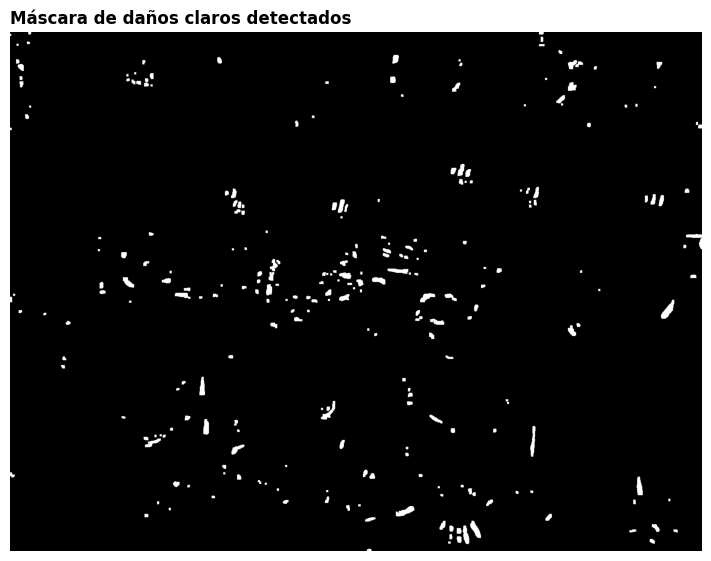

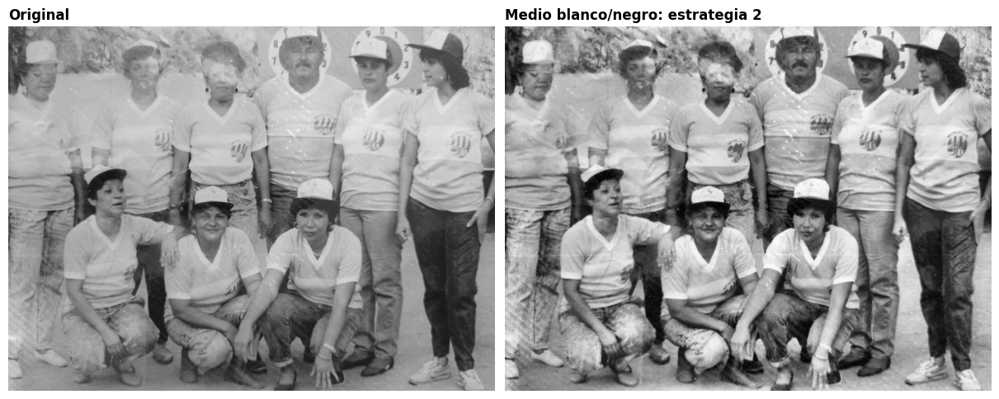

Esta estrategia usa CLAHE para mejorar el contraste local de la fotografía y luego aplica una restauración puntual con inpainting sobre una máscara de rayas o marcas claras. La máscara se construye de forma conservadora para no intervenir zonas importantes como rostros o detalles de la ropa. Finalmente se aplica un suavizado leve para integrar el resultado.
Se elige la estrategia 2 porque mejora el contraste de manera local y además intenta reparar marcas claras o rayas pequeñas del soporte. La estrategia 1 mejora el contraste general, pero puede aumentar también la visibilidad del ruido y las manchas. La estrategia 2 resulta más adecuada para una imagen deteriorada de forma irregular, aunque mantiene límites: no recupera detalle perdido y el inpainting debe usarse con cuidado para no alterar información real.


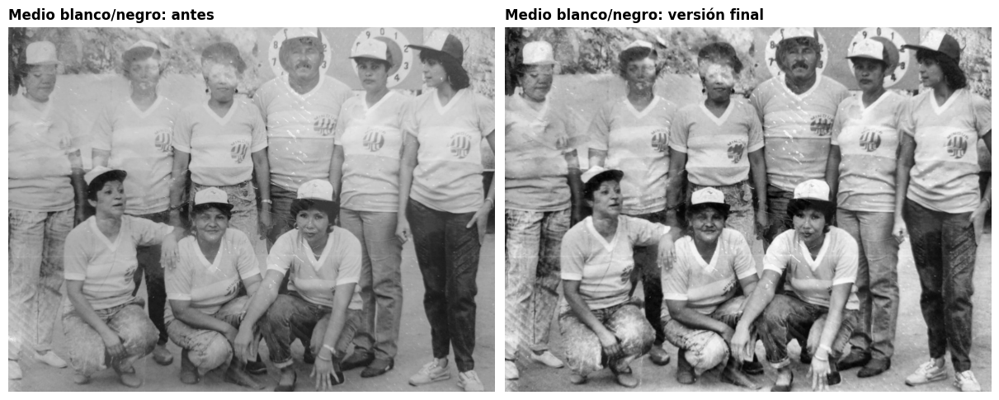

Salida guardada en: C:\Users\Tamara\Desktop\PDI 2026\rodriguez-carmen-pdi-1c-2026\006 - TFI_1\salidas_tfi1\medio_grafico_bn_final.png


In [ ]:
# Estrategia 2
imagen_medio_bn_estrategia_2 = None

if imagen_medio_bn_gris is not None:
    # Creamos una copia
    imagen_medio_bn_estrategia_2 = imagen_medio_bn_gris.copy()

    # Aplicamos CLAHE
    clahe = cv2.createCLAHE(
        clipLimit=2.0,
        tileGridSize=(8, 8)
    )

    imagen_clahe = clahe.apply(imagen_medio_bn_estrategia_2)

    # Construimos una máscara conservadora de daños claros y finos
    kernel_tophat = cv2.getStructuringElement(cv2.MORPH_RECT, (15, 15))
    detalles_claros = cv2.morphologyEx(
        imagen_medio_bn_estrategia_2,
        cv2.MORPH_TOPHAT,
        kernel_tophat
    )

    # Umbralizamos
    _, mascara_danos = cv2.threshold(
        detalles_claros,
        35,
        255,
        cv2.THRESH_BINARY
    )

    # Limpiamos la máscara para quitar puntos muy pequeños y unir rayas finas
    kernel_limpieza = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))

    mascara_danos = cv2.morphologyEx(
        mascara_danos,
        cv2.MORPH_OPEN,
        kernel_limpieza
    )

    mascara_danos = cv2.dilate(
        mascara_danos,
        kernel_limpieza,
        iterations=1
    )

    # Mostramos la máscara
    mostrar_imagen(mascara_danos, "Máscara de daños claros detectados")

    # Aplicamos inpainting de forma puntual
    imagen_restaurada = cv2.inpaint(
        imagen_clahe,
        mascara_danos,
        3,
        cv2.INPAINT_TELEA
    )

    # Aplicamos un suavizado muy leve para integrar mejor la restauración
    imagen_medio_bn_estrategia_2 = cv2.GaussianBlur(
        imagen_restaurada,
        (3, 3),
        0
    )

    mostrar_comparacion(
        imagen_medio_bn_gris,
        imagen_medio_bn_estrategia_2,
        "Original",
        "Medio blanco/negro: estrategia 2"
    )

observacion_medio_bn_estrategia_2 = (
    "Esta estrategia usa CLAHE para mejorar el contraste local de la fotografía y luego "
    "aplica una restauración puntual con inpainting sobre una máscara de rayas o marcas claras. "
    "La máscara se construye de forma conservadora para no intervenir zonas importantes como rostros "
    "o detalles de la ropa. Finalmente se aplica un suavizado leve para integrar el resultado."
)

print(observacion_medio_bn_estrategia_2)

# Elección de versión final para el caso
imagen_medio_bn_final = imagen_medio_bn_estrategia_2

# Justificación de la elección
justificacion_medio_bn_final = (
    "Se elige la estrategia 2 porque mejora el contraste de manera local y además intenta reparar "
    "marcas claras o rayas pequeñas del soporte. La estrategia 1 mejora el contraste general, pero puede "
    "aumentar también la visibilidad del ruido y las manchas. La estrategia 2 resulta más adecuada para "
    "una imagen deteriorada de forma irregular, aunque mantiene límites: no recupera detalle perdido y "
    "el inpainting debe usarse con cuidado para no alterar información real."
)

print(justificacion_medio_bn_final)

# Guardamos la salida final
if imagen_medio_bn_final is not None:
    ruta_salida_medio_bn = carpeta_salidas_tfi / "medio_grafico_bn_final.png"
    guardar_gris(ruta_salida_medio_bn, imagen_medio_bn_final)

    if imagen_medio_bn_gris is not None:
        mostrar_comparacion(
            imagen_medio_bn_gris,
            imagen_medio_bn_final,
            "Medio blanco/negro: antes",
            "Medio blanco/negro: versión final"
        )

    print(f"Salida guardada en: {ruta_salida_medio_bn.resolve()}")


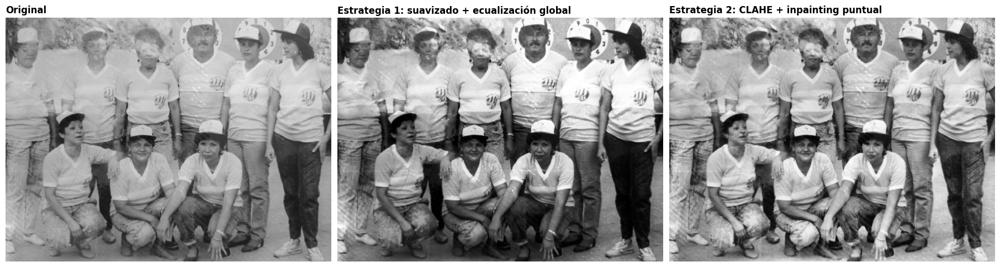


Elección final: estrategia 2 - CLAHE + inpainting puntual.
Justificación: Se elige la estrategia 2 porque mejora el contraste local mediante CLAHE y además permite corregir daños puntuales con inpainting. A diferencia de la ecualización global, evita lavar la imagen y conserva mejor los detalles. Su límite es que el inpainting depende de la máscara y no recupera información perdida.


In [ ]:
# Comparación final entre la imagen original y las dos estrategias del medio gráfico blanco/negro.

if (
    imagen_medio_bn_gris is not None
    and imagen_medio_bn_estrategia_1 is not None
    and imagen_medio_bn_estrategia_2 is not None
):
    figura, ejes = plt.subplots(1, 3, figsize=(18, 6), constrained_layout=True)

    imagenes = [
        imagen_medio_bn_gris,
        imagen_medio_bn_estrategia_1,
        imagen_medio_bn_estrategia_2
    ]

    titulos = [
        "Original",
        "Estrategia 1: suavizado + ecualización global",
        "Estrategia 2: CLAHE + inpainting puntual"
    ]

    for eje, imagen, titulo in zip(ejes, imagenes, titulos):
        eje.imshow(imagen, cmap="gray")
        eje.set_title(titulo, fontweight="bold", loc="left")
        eje.axis("off")

    plt.show()

    imagen_medio_bn_final = imagen_medio_bn_estrategia_2

    justificacion_medio_bn_final = (
        "Se elige la estrategia 2 porque mejora el contraste local mediante CLAHE "
        "y además permite corregir daños puntuales con inpainting. A diferencia de la "
        "ecualización global, evita lavar la imagen y conserva mejor los detalles. "
        "Su límite es que el inpainting depende de la máscara y no recupera información perdida."
    )

    print("\nElección final: estrategia 2 - CLAHE + inpainting puntual.")
    print("Justificación:", justificacion_medio_bn_final)

else:
    print("Primero ejecutá la carga de la imagen y las dos estrategias del medio gráfico blanco/negro.")

## Elección final — Caso 3: Medio gráfico blanco/negro

Se elige la **estrategia 2: CLAHE + máscara de daños + inpainting puntual**.

### Justificación

Esta estrategia resulta más adecuada porque el problema de la imagen no es solo el bajo contraste, sino también la presencia de **manchas, rayas y degradación del soporte**.

El uso de CLAHE permite:
- mejorar el contraste local sin lavar la imagen;
- recuperar detalles en zonas claras y oscuras;
- mantener mejor la estructura general que una ecualización global.

El inpainting puntual complementa la mejora al:
- reducir rayas y manchas visibles;
- restaurar zonas específicas sin afectar toda la imagen.

En comparación, la estrategia 1:
- mejora el contraste general;
- pero también amplifica el ruido y las imperfecciones;
- no resuelve los daños localizados del soporte.

### Limitaciones

- El inpainting depende de la calidad de la máscara y puede modificar información real si no es precisa.
- La mejora de contraste puede hacer más visible el ruido residual.
- No se recupera la nitidez original ni detalles completamente perdidos.

## Cierre comparativo

Ahora te toca salir del caso puntual y mirar el integrador como conjunto. La pregunta no es solo que funciono, sino tambien **por que convino una estrategia en un caso y no en otro**.


In [ ]:
# Comparación final de todos los casos
casos = [
    "Cámara oscura",
    "Medio gráfico color",
    "Medio gráfico blanco/negro"
]

problemas_principales = [
    diagnostico_camara_oscura,
    diagnostico_medio_color,
    diagnostico_medio_bn
]

estrategias_finales = [
    justificacion_camara_final,
    justificacion_medio_color_final,
    justificacion_medio_bn_final
]

# Registramos los límites de cada resultado
limites_detectados = [
    (
        "La mejora aumenta la visibilidad general, pero no recupera la nitidez perdida "
        "ni la información ausente en zonas demasiado oscuras. La iluminación sigue siendo irregular."
    ),
    (
        "La mejora recupera contraste y color, pero no elimina por completo el velo de la imagen "
        "ni reconstruye detalles perdidos. Un aumento excesivo de saturación podría producir colores artificiales."
    ),
    (
        "La mejora reduce parte del deterioro visible, pero no elimina todas las manchas o rayas. "
        "El inpainting debe usarse con cuidado porque puede modificar información real si la máscara no es precisa."
    )
]

tipo_de_problema = [
    "Iluminación / contraste local",
    "Color / contraste global",
    "Daño físico + contraste"
]

tabla_final = pd.DataFrame({
    "Caso": casos,
    "Tipo de problema": tipo_de_problema,
    "Problema principal": problemas_principales,
    "Decisión final": estrategias_finales,
    "Límites": limites_detectados,
})

display(tabla_final)


print(
    "La comparación muestra que no existe una única estrategia válida para todos los casos, "
    "ya que cada uno presenta un tipo de degradación diferente.\n\n"

    "En la cámara oscura, la elección de CLAHE se justifica porque la iluminación es irregular, "
    "algo que no se resuelve bien con ajustes globales como los utilizados en el caso de medio gráfico color. "
    "En este último, separar luminancia y saturación resulta más adecuado, ya que el problema principal no es solo el contraste, "
    "sino también la pérdida de color.\n\n"

    "En el caso blanco/negro, a diferencia de los anteriores, no alcanza con mejorar contraste: "
    "es necesario incorporar restauración puntual mediante inpainting para tratar daños del soporte, "
    "algo que no sería necesario ni adecuado en los otros casos.\n\n"

    "Esto evidencia que la elección del pipeline depende directamente del tipo de degradación presente, "
    "y que aplicar la misma estrategia en todos los casos llevaría a resultados subóptimos o incluso incorrectos."
)



,Caso,Tipo de problema,Problema principal,Decisión final,Límites
0,Cámara oscura,Iluminación / contraste local,"imagen muy oscura, bajo contraste, iluminación...",Se elige la estrategia 2 porque CLAHE mejora e...,"La mejora aumenta la visibilidad general, pero..."
1,Medio gráfico color,Color / contraste global,"colores apagados, bajo contraste, iluminación ...",Se elige la estrategia 2 porque mejora el cont...,"La mejora recupera contraste y color, pero no ..."
2,Medio gráfico blanco/negro,Daño físico + contraste,"bajo contraste, imagen lavada, manchas, rayas ...",Se elige la estrategia 2 porque mejora el cont...,"La mejora reduce parte del deterioro visible, ..."


La comparación muestra que no existe una única estrategia válida para todos los casos, ya que cada uno presenta un tipo de degradación diferente.

En la cámara oscura, la elección de CLAHE se justifica porque la iluminación es irregular, algo que no se resuelve bien con ajustes globales como los utilizados en el caso de medio gráfico color. En este último, separar luminancia y saturación resulta más adecuado, ya que el problema principal no es solo el contraste, sino también la pérdida de color.

En el caso blanco/negro, a diferencia de los anteriores, no alcanza con mejorar contraste: es necesario incorporar restauración puntual mediante inpainting para tratar daños del soporte, algo que no sería necesario ni adecuado en los otros casos.

Esto evidencia que la elección del pipeline depende directamente del tipo de degradación presente, y que aplicar la misma estrategia en todos los casos llevaría a resultados subóptimos o incluso incorrectos.


## Reflexion final

Respondan con sus palabras:

1. ¿Que decision tecnica les resulto mas dificil de justificar y por que?
La decisión técnica más difícil de justificar fue el uso de inpainting en el caso de medio gráfico blanco/negro. Aunque ayuda a reducir rayas o marcas visibles, depende mucho de la máscara utilizada. Si la máscara toma zonas importantes de la imagen, puede alterar información real, especialmente en rostros o detalles de la ropa.
2. ¿En que caso la mejora fue mas clara y en cual fue mas limitada?
La mejora más clara fue en el caso de medio gráfico color, porque la estrategia con CLAHE, ajuste de saturación y denoise permitió recuperar contraste y color sin modificar completamente la imagen. La mejora más limitada fue en la cámara oscura, porque la imagen original tenía poca nitidez, iluminación irregular y zonas muy oscuras donde la información ya estaba casi perdida.
3. ¿Que aprendieron sobre la relacion entre tipo de degradacion y tipo de operacion?
Aprendimos que cada tipo de degradación necesita una operación distinta. Cuando el problema es bajo contraste global, puede servir un ajuste lineal o una ecualización. Cuando hay iluminación irregular, conviene una mejora local como CLAHE. Cuando hay ruido, el suavizado ayuda, pero debe ser leve para no borrar detalles. Y cuando hay daños localizados, el inpainting puede servir, pero solo si se construye una máscara cuidadosa.
4. ¿Que harian distinto si tuvieran una segunda iteracion de trabajo?
En una segunda iteración probaríamos ajustar los parámetros con más precisión y construir máscaras de daño más controladas. También compararíamos métricas simples, como histogramas antes/después, además de la comparación visual. En el caso de cámara oscura, intentaríamos nuevas capturas con mejor enfoque o más control de iluminación, porque el procesamiento no puede recuperar toda la información perdida desde la toma original.
## Lista de control antes de entregar

- Resolvi los tres casos obligatorios.
- Mostre la imagen original en cada caso.
- Compare al menos dos estrategias por caso.
- Justifique la eleccion final de cada pipeline.
- Guarde las tres imagenes procesadas.
- Complete la tabla final de comparacion.
- Registre el uso de IA de manera breve y critica.
- Escribi una reflexion final con limites del metodo.

## Defensa oral breve

En la defensa cada integrante tiene que poder explicar el problema principal de cada caso, la razon de la estrategia elegida y el limite mas importante de la restauracion realizada.
